<a href="https://colab.research.google.com/github/davidmuna/Network-Anomaly-Detection/blob/main/Final_3_Week_Core_Project.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#Network Anomaly Detection









## 1. Defining the Question

### a) Specifying the Data Analytic Question

> Network intrusion detection has become increasingly important with the rapid rise of internet technology and the accompanying growth in the number of network attacks. Our goal is to create an anomaly detection model to detect a cyber attack based on the UNSW-NB 15 dataset.

### b) Defining the Metric for Success

Our project will be deemed succesful when the following are obtained:
1.   Identifying the most common types of attacks and its' characteristics
2.   Anomaly detection models
3. Performance of the models are evaluated

### c) Understanding the Context 




Anomaly-based network intrusion detection refers to finding exceptional or nonconforming patterns in network traffic data compared to normal behavior. Finding these anomalies has extensive applications in areas such as cyber security, credit card and insurance fraud detection, and military surveillance for enemy activities. Network Anomaly Detection: A Machine Learning Perspective presents machine learning techniques in depth to help you more effectively detect and counter network intrusion.

For Market Relevance, Anomaly Detection is importnant In order to maintain the principles of network security i.e, confidentiality, integrity and availability of our network and data . These include but not limited to;







- Protect client data
- Protect computers from harmful spyware
- Keep shared data Secure from Industrial Espionage.
- Increased Network Performance by reducing costs in the long run due to fewer downtimes and less lagging, which in the long run will boost business profit


### d) Recording the Experimental Design

1.   Reading & Checking the data
2.   Tidying the data
3.   Exploratory Data Analysis
4.   Sampling and Dimensionality Reduction
5.   Modelling & Performance Tuning
6.   Evaluation
7.   Recommendations

### e) Data Relevance

The datasets provided are relevant for performing univariate, bivariate, multivariate analysis and implementing solutions.  


*   Dataset 1 [UNSW-NB15_1.csv](https://www.unsw.adfa.edu.au/unsw-canberra-cyber/cybersecurity/ADFA-NB15-Datasets/UNSW-NB15_1.csv)
*   Dataset 2 [UNSW-NB15_2.csv](https://www.unsw.adfa.edu.au/unsw-canberra-cyber/cybersecurity/ADFA-NB15-Datasets/UNSW-NB15_2.csv)
*   Dataset 3 [UNSW-NB15_3.csv](https://www.unsw.adfa.edu.au/unsw-canberra-cyber/cybersecurity/ADFA-NB15-Datasets/UNSW-NB15_3.csv)
*   Dataset 4 [UNSW-NB15_4.csv](https://www.unsw.adfa.edu.au/unsw-canberra-cyber/cybersecurity/ADFA-NB15-Datasets/UNSW-NB15_4.csv)
*   Dataset Features Description [NUSW-NB15_features.csv](https://www.unsw.adfa.edu.au/unsw-canberra-cyber/cybersecurity/ADFA-NB15-Datasets/NUSW-NB15_features.csv)



## 2. Reading the Data

In [ ]:
# Importing the necessary libraries to be used in the analysis
import pandas as pd
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')
%matplotlib inline

In [ ]:
# Load the Drive helper and mount
from google.colab import drive
# This will prompt for authorization.
drive.mount('/content/drive')
!ls "/content/drive/My Drive/Network Anomaly Detection/UNSW-NB15 - CSV Files/"

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
'a part of training and testing set'   UNSW-NB15_2.csv
 NUSW-NB15_features.csv		       UNSW-NB15_3.csv
 NUSW-NB15_GT.csv		       UNSW-NB15_4.csv
'The UNSW-NB15 description.pdf'        UNSW-NB15_LIST_EVENTS.csv
 UNSW-NB15_1.csv


In [ ]:
# Loading our data

# We will load our data and merge all four files into one. 
# We then export the merged csv and re-use it for our analysis since loading the four csv's takes time
data1 = pd.read_csv("/content/drive/My Drive/Network Anomaly Detection/UNSW-NB15 - CSV Files/UNSW-NB15_1.csv")
data2 = pd.read_csv("/content/drive/My Drive/Network Anomaly Detection/UNSW-NB15 - CSV Files/UNSW-NB15_2.csv")
data3 = pd.read_csv("/content/drive/My Drive/Network Anomaly Detection/UNSW-NB15 - CSV Files/UNSW-NB15_3.csv")
data4 = pd.read_csv("/content/drive/My Drive/Network Anomaly Detection/UNSW-NB15 - CSV Files/UNSW-NB15_4.csv")
description = pd.read_csv("/content/drive/My Drive/Network Anomaly Detection/UNSW-NB15 - CSV Files/NUSW-NB15_features.csv", encoding='ISO-8859-1')

In [ ]:
# Renaming datasets column names for standardisation
def col_standards(x):
   x.columns = description['Name']
   return x.columns

col_standards(data1)
col_standards(data2)
col_standards(data3)
col_standards(data4)


Index(['srcip', 'sport', 'dstip', 'dsport', 'proto', 'state', 'dur', 'sbytes',
       'dbytes', 'sttl', 'dttl', 'sloss', 'dloss', 'service', 'Sload', 'Dload',
       'Spkts', 'Dpkts', 'swin', 'dwin', 'stcpb', 'dtcpb', 'smeansz',
       'dmeansz', 'trans_depth', 'res_bdy_len', 'Sjit', 'Djit', 'Stime',
       'Ltime', 'Sintpkt', 'Dintpkt', 'tcprtt', 'synack', 'ackdat',
       'is_sm_ips_ports', 'ct_state_ttl', 'ct_flw_http_mthd', 'is_ftp_login',
       'ct_ftp_cmd', 'ct_srv_src', 'ct_srv_dst', 'ct_dst_ltm', 'ct_src_ ltm',
       'ct_src_dport_ltm', 'ct_dst_sport_ltm', 'ct_dst_src_ltm', 'attack_cat',
       'Label'],
      dtype='object', name='Name')

In [ ]:
# Merging the data1 to data2 into df
df =  pd.concat([data1,data2], axis=0).reset_index(drop=True)

# Merging the df to data3 into df1
df1 =  pd.concat([df,data3], axis=0).reset_index(drop=True)

# Merging the df1 to data4 into all_data
all_data =  pd.concat([df1,data4], axis=0).reset_index(drop=True)

In [ ]:
# Standardising column names to lower case and removing trailing spaces
all_data.columns = all_data.columns.str.strip().str.lower().str.replace(' ', '')

## 3. Data Exploration

In [ ]:
# Determining the no. of records in our dataset
all_data.shape

(2540043, 49)

In [ ]:
# Checking description of features
description

,No.,Name,Type,Description
0,1,srcip,nominal,Source IP address
1,2,sport,integer,Source port number
2,3,dstip,nominal,Destination IP address
3,4,dsport,integer,Destination port number
4,5,proto,nominal,Transaction protocol
5,6,state,nominal,Indicates to the state and its dependent proto...
6,7,dur,Float,Record total duration
7,8,sbytes,Integer,Source to destination transaction bytes
8,9,dbytes,Integer,Destination to source transaction bytes
9,10,sttl,Integer,Source to destination time to live value


In [ ]:
# Previewing the top of our dataset
all_data.head(5)

Name,srcip,sport,dstip,dsport,proto,state,dur,sbytes,dbytes,sttl,dttl,sloss,dloss,service,sload,dload,spkts,dpkts,swin,dwin,stcpb,dtcpb,smeansz,dmeansz,trans_depth,res_bdy_len,sjit,djit,stime,ltime,sintpkt,dintpkt,tcprtt,synack,ackdat,is_sm_ips_ports,ct_state_ttl,ct_flw_http_mthd,is_ftp_login,ct_ftp_cmd,ct_srv_src,ct_srv_dst,ct_dst_ltm,ct_src_ltm,ct_src_dport_ltm,ct_dst_sport_ltm,ct_dst_src_ltm,attack_cat,label
0,59.166.0.0,33661,149.171.126.9,1024,udp,CON,0.036133,528,304,31,29,0,0,-,87676.08594,50480.17188,4,4,0,0,0,0,132,76,0,0,9.891010,10.682733,1421927414,1421927414,7.005,7.564333,0.0,0.0,0.0,0,0,0.0,0.0,0,2,4,2,3,1,1,2,NaN,0
1,59.166.0.6,1464,149.171.126.7,53,udp,CON,0.001119,146,178,31,29,0,0,dns,521894.53130,636282.37500,2,2,0,0,0,0,73,89,0,0,0.000000,0.000000,1421927414,1421927414,0.017,0.013000,0.0,0.0,0.0,0,0,0.0,0.0,0,12,8,1,2,2,1,1,NaN,0
2,59.166.0.5,3593,149.171.126.5,53,udp,CON,0.001209,132,164,31,29,0,0,dns,436724.56250,542597.18750,2,2,0,0,0,0,66,82,0,0,0.000000,0.000000,1421927414,1421927414,0.043,0.014000,0.0,0.0,0.0,0,0,0.0,0.0,0,6,9,1,1,1,1,1,NaN,0
3,59.166.0.3,49664,149.171.126.0,53,udp,CON,0.001169,146,178,31,29,0,0,dns,499572.25000,609067.56250,2,2,0,0,0,0,73,89,0,0,0.000000,0.000000,1421927414,1421927414,0.005,0.003000,0.0,0.0,0.0,0,0,0.0,0.0,0,7,9,1,1,1,1,1,NaN,0
4,59.166.0.0,32119,149.171.126.9,111,udp,CON,0.078339,568,312,31,29,0,0,-,43503.23438,23896.14258,4,4,0,0,0,0,142,78,0,0,29.682221,34.370340,1421927414,1421927414,21.003,24.315000,0.0,0.0,0.0,0,0,0.0,0.0,0,2,4,2,3,1,1,2,NaN,0


In [ ]:
# Previewing the bottom of our dataset
all_data.tail(5)

Name,srcip,sport,dstip,dsport,proto,state,dur,sbytes,dbytes,sttl,dttl,sloss,dloss,service,sload,dload,spkts,dpkts,swin,dwin,stcpb,dtcpb,smeansz,dmeansz,trans_depth,res_bdy_len,sjit,djit,stime,ltime,sintpkt,dintpkt,tcprtt,synack,ackdat,is_sm_ips_ports,ct_state_ttl,ct_flw_http_mthd,is_ftp_login,ct_ftp_cmd,ct_srv_src,ct_srv_dst,ct_dst_ltm,ct_src_ltm,ct_src_dport_ltm,ct_dst_sport_ltm,ct_dst_src_ltm,attack_cat,label
2540038,59.166.0.5,33094,149.171.126.7,43433,tcp,FIN,0.087306,320,1828,31,29,1,2,ftp-data,24465.671880,146610.765600,6,8,255,255,4035116044,222196311,53,229,0,0,1221.136547,30.096029,1424262068,1424262069,17.394400,12.405143,0.000608,0.000468,0.000140,0,0,NaN,NaN,,1,2,3,3,1,1,3,NaN,0
2540039,59.166.0.7,20848,149.171.126.4,21,tcp,CON,0.365058,456,346,31,29,2,2,ftp,8743.816406,6333.240234,8,6,255,255,1529727621,185369967,57,58,0,0,3961.093354,129.038367,1424262068,1424262069,51.976999,72.915602,0.000609,0.000477,0.000132,0,0,NaN,2.0,2,2,2,2,2,2,2,2,NaN,0
2540040,59.166.0.3,21511,149.171.126.9,21,tcp,CON,6.335154,1802,2088,31,29,7,9,ftp,2204.839844,2549.582764,32,30,255,255,497208793,889904111,56,70,0,0,13233.728560,379.052750,1424262062,1424262069,204.359814,214.372375,0.000617,0.000485,0.000132,0,0,NaN,2.0,2,2,2,4,2,2,2,2,NaN,0
2540041,59.166.0.9,35433,149.171.126.0,80,tcp,CON,2.200934,3498,166054,31,29,2,57,http,12496.513670,598375.062500,58,116,255,255,1289728069,3436097151,60,1432,1,79745,2868.893137,1951.035944,1424262067,1424262069,38.609700,19.133826,0.000680,0.000541,0.000139,0,0,2.0,NaN,,1,1,2,4,2,2,2,NaN,0
2540042,175.45.176.0,17293,149.171.126.17,110,tcp,CON,0.942984,574,676,62,252,5,6,pop3,4470.913574,5259.898438,12,12,255,255,3026824982,3748412468,48,56,0,0,3903.523582,95.650531,1424262068,1424262069,79.714089,80.827180,0.139446,0.053884,0.085562,0,3,NaN,NaN,,1,1,2,4,2,2,2,Exploits,1


In [ ]:
# Checking whether each column has an appropriate datatype
all_data.dtypes

Name
srcip                object
sport                object
dstip                object
dsport               object
proto                object
state                object
dur                 float64
sbytes                int64
dbytes                int64
sttl                  int64
dttl                  int64
sloss                 int64
dloss                 int64
service              object
sload               float64
dload               float64
spkts                 int64
dpkts                 int64
swin                  int64
dwin                  int64
stcpb                 int64
dtcpb                 int64
smeansz               int64
dmeansz               int64
trans_depth           int64
res_bdy_len           int64
sjit                float64
djit                float64
stime                 int64
ltime                 int64
sintpkt             float64
dintpkt             float64
tcprtt              float64
synack              float64
ackdat              float64
is_sm_ips_ports

In [ ]:
# Datatypes in our data
all_data.dtypes.value_counts()

int64      28
float64    12
object      9
dtype: int64

## Observation
There are 28 integers, 12 floats and 9 objects

## 5. Data Preparation & Cleaning

In [ ]:
# Checking for Missing Records using missingno
all_data.isna().sum()

Name
srcip                     0
sport                     0
dstip                     0
dsport                    0
proto                     0
state                     0
dur                       0
sbytes                    0
dbytes                    0
sttl                      0
dttl                      0
sloss                     0
dloss                     0
service                   0
sload                     0
dload                     0
spkts                     0
dpkts                     0
swin                      0
dwin                      0
stcpb                     0
dtcpb                     0
smeansz                   0
dmeansz                   0
trans_depth               0
res_bdy_len               0
sjit                      0
djit                      0
stime                     0
ltime                     0
sintpkt                   0
dintpkt                   0
tcprtt                    0
synack                    0
ackdat                    0
is_sm_ips_ports

There are 3 features with missing values namely, ct_flw_http_mthd,is_ftp_login,attack_cat           

In [ ]:
# Filling Missing Records from attack_cat with normal since the present values represent attacks
all_data['attack_cat'] = all_data.attack_cat.fillna(value='normal').apply(lambda x: x.strip().lower())

In [ ]:
# Checking Value Counts for ct_flw_http_mthd to identify the mode value
all_data['ct_flw_http_mthd'].value_counts()

0.0     986789
1.0     188008
6.0       7902
4.0       6564
3.0        738
2.0        588
5.0        430
9.0        270
14.0       224
12.0       132
30.0        60
8.0         56
16.0        48
36.0        36
10.0        30
25.0        25
Name: ct_flw_http_mthd, dtype: int64

In [ ]:
# Checking for Anomalies (Should be binary)
all_data['is_ftp_login'].value_counts()

0.0    1066591
1.0      43389
4.0        156
2.0         30
Name: is_ftp_login, dtype: int64

In [ ]:
# Removing records with the above Anomaly in is_ftp_login
all_data1 = all_data[all_data['is_ftp_login'] <2]
all_data1['is_ftp_login'].value_counts()

0.0    1066591
1.0      43389
Name: is_ftp_login, dtype: int64

In [ ]:
# Checking for Anomalies ( Should be Binary)
all_data['is_sm_ips_ports'].value_counts()

0    2535848
1       4195
Name: is_sm_ips_ports, dtype: int64

In [ ]:
# Dealing with the Missing Data in ct_flw_http_mthd & is_ftp_login 

# We replace missing values in is_ftp_login with Zero because this is the mode value in this Binary feature
all_data['is_ftp_login'] = (all_data.is_ftp_login.fillna(value=0)).astype(int)

# We replace missing values in ct_flw_http_mthd with Zero because this is the mode value in this feature
all_data['ct_flw_http_mthd'] = (all_data.is_ftp_login.fillna(value=0)).astype(int)

In [ ]:
# Checking for duplicates
all_data.duplicated().sum()



480626

These 480626 are probably not duplicates since the same attack can be carried out numerous times while trying to penetrate the network We retain them

In [ ]:
# Checking for Anomalies by identifying unique values in categorical columns
cat_cols = all_data[['srcip','sport','dstip','dsport','proto','state','service','ct_ftp_cmd','attack_cat','label']]

for column in cat_cols.columns:
  print(column)

  print(cat_cols[column].unique())
  print('\n')

srcip
['59.166.0.0' '59.166.0.6' '59.166.0.5' '59.166.0.3' '10.40.182.3'
 '59.166.0.7' '10.40.170.2' '59.166.0.1' '59.166.0.2' '59.166.0.4'
 '175.45.176.3' '175.45.176.2' '175.45.176.0' '59.166.0.8' '59.166.0.9'
 '175.45.176.1' '10.40.182.1' '10.40.85.1' '192.168.241.243' '10.40.85.30'
 '149.171.126.16' '149.171.126.2' '149.171.126.11' '149.171.126.4'
 '149.171.126.5' '149.171.126.17' '149.171.126.19' '149.171.126.9'
 '149.171.126.8' '149.171.126.7' '149.171.126.15' '149.171.126.6'
 '149.171.126.0' '149.171.126.1' '149.171.126.3' '149.171.126.13'
 '149.171.126.12' '149.171.126.10' '149.171.126.18' '127.0.0.1'
 '149.171.126.14' '10.40.85.10' '10.40.182.6']


sport
[33661 1464 3593 ... 533 933 706]


dstip
['149.171.126.9' '149.171.126.7' '149.171.126.5' '149.171.126.0'
 '149.171.126.4' '10.40.182.3' '149.171.126.6' '10.40.170.2'
 '149.171.126.18' '149.171.126.16' '149.171.126.8' '149.171.126.2'
 '149.171.126.1' '149.171.126.10' '149.171.126.3' '149.171.126.15'
 '149.171.126.14' '149.171

We detected an anomaly in the attack_cat column where there was backdoors and backdoor

In [ ]:
# Removing anomalies in attack_cat(backdoors)
all_data['attack_cat'] = all_data['attack_cat'].str.replace("backdoors", "backdoor", case = True)
all_data['attack_cat'].unique()

array(['normal', 'exploits', 'reconnaissance', 'dos', 'generic',
       'shellcode', 'fuzzers', 'worms', 'backdoor', 'analysis'],
      dtype=object)

In [ ]:
# Removing anomalies in attack_cat(Shellcode)
all_data['attack_cat'] = all_data['attack_cat'].str.replace(' Shellcode ', "Shellcode", case = True)
all_data['attack_cat'].unique()

array(['normal', 'exploits', 'reconnaissance', 'dos', 'generic',
       'shellcode', 'fuzzers', 'worms', 'backdoor', 'analysis'],
      dtype=object)

In [ ]:
# Removing anomalies in attack_cat(fuzzers)
all_data['attack_cat'] = all_data['attack_cat'].str.replace(' Fuzzers ','Fuzzers', case = True)
all_data['attack_cat'] = all_data['attack_cat'].str.replace('Fuzzers ','Fuzzers', case = True)
all_data['attack_cat'].unique()

array(['normal', 'exploits', 'reconnaissance', 'dos', 'generic',
       'shellcode', 'fuzzers', 'worms', 'backdoor', 'analysis'],
      dtype=object)

## Outliers

We did not check for outliers as they are probably anomalies or attacks that we want to identify in the dataset

## 6. Exploratory Data Analysis

#### Univariate Analysis 

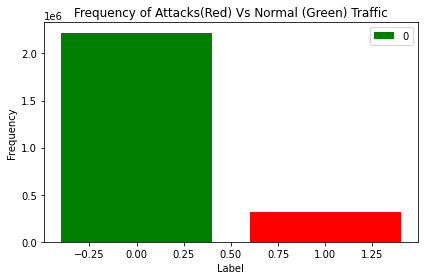

In [ ]:
# Viewing the total number of attacks (1) versus normal traffic (0)
attack_frequency = all_data.groupby(['label']).size().reset_index(name = 'frequency').rename(columns = {'0':''})

my_colors = 'grbkymc'

plt.bar(attack_frequency['label'], attack_frequency['frequency'], color = my_colors )
plt.title("Frequency of Attacks(Red) Vs Normal (Green) Traffic")
plt.xlabel("Label")
plt.ylabel("Frequency")
plt.legend(attack_frequency['label'])
plt.tight_layout()
plt.show()



Observation:
- The attacks are represented in red and they're fewer than what is considered normal.
- Our dependent variable is imbalanced 



In [ ]:
# Grouping the source ip and destination ip addresses by the highest number of attacks
traffic_srcip = all_data[all_data['label']==1].groupby('srcip')['traffic'].count().sort_values(ascending=False)
traffic_dstip = all_data[all_data['label']==1].groupby('dstip')['traffic'].count().sort_values(ascending=False)


In [ ]:
traffic_srcip

srcip
175.45.176.1    117908
175.45.176.3    106418
175.45.176.0     74279
175.45.176.2     22678
Name: traffic, dtype: int64

Top 5 source Ips with the highest number of attacks

In [ ]:
traffic_dstip

dstip
149.171.126.18    100187
149.171.126.15     46904
149.171.126.14     41826
149.171.126.10     40934
149.171.126.12     27782
149.171.126.17     22644
149.171.126.13     12643
149.171.126.19     12049
149.171.126.11      8886
149.171.126.16      7428
Name: traffic, dtype: int64

Top 10 destination Ips with the highest number of attacks

##### Countplots of Ip addresses with the highest number of traffic

In [ ]:
# Creating a new column 'traffic' with constant value of 1 to indicate every time a source ip address generated traffic
all_data['traffic'] = 1

Text(0, 0.5, 'Traffic')

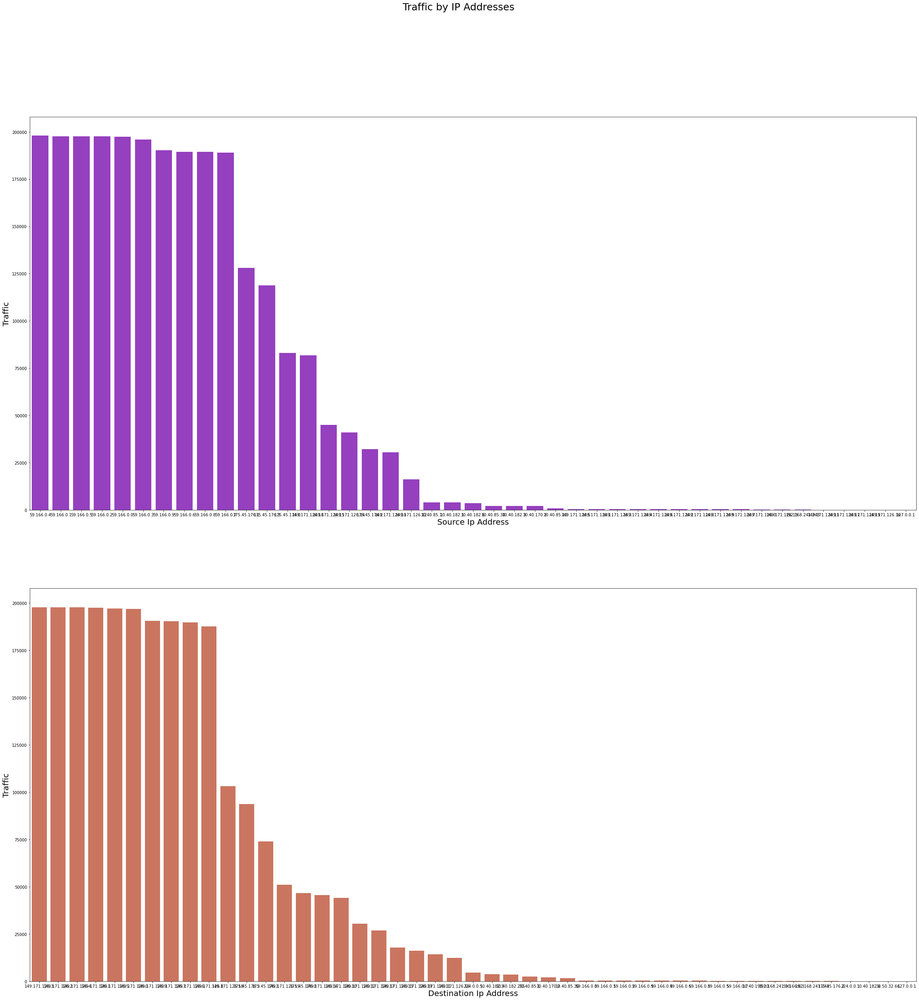

In [ ]:
# Countplots of Source and Destination IP Addresses
fig, (ax1,ax2) = plt.subplots(2, figsize=(40, 40)) 
fig.suptitle('Traffic by IP Addresses', fontsize=25)
sns.countplot(all_data['srcip'], color='#AA00FF',saturation=0.5, order = all_data['srcip'].value_counts().index, ax=ax1)
sns.countplot(all_data['dstip'], color='#FF552A',saturation=0.5, order = all_data['dstip'].value_counts().index, ax=ax2 )

ax1.set_xlabel('Source Ip Address', fontsize=20)
ax1.set_ylabel('Traffic', fontsize=20)

ax2.set_xlabel('Destination Ip Address', fontsize=20)
ax2.set_ylabel('Traffic', fontsize=20)

In [ ]:
# Identifying the first 10 Source and Destination IP Addresses
print("First 10 Source IPs\n : ", traffic_srcip.head(10))
print("##############################################\n")
print("First 10 Destination IPs\n : ", traffic_dstip.head(10))

First 10 Source IPs
 :  srcip
59.166.0.4    197959
59.166.0.1    197679
59.166.0.5    197626
59.166.0.2    197550
59.166.0.0    197526
59.166.0.3    195953
59.166.0.9    190186
59.166.0.6    189419
59.166.0.8    189341
59.166.0.7    189059
Name: traffic, dtype: int64
##############################################

First 10 Destination IPs
 :  dstip
149.171.126.3    197771
149.171.126.2    197648
149.171.126.4    197638
149.171.126.1    197535
149.171.126.5    196999
149.171.126.0    196770
149.171.126.9    190483
149.171.126.7    190267
149.171.126.6    189708
149.171.126.8    187479
Name: traffic, dtype: int64


In [ ]:
# Summary Statistics
round(all_data.describe(), 1)

Name,dur,sbytes,dbytes,sttl,dttl,sloss,dloss,sload,dload,spkts,dpkts,swin,dwin,stcpb,dtcpb,smeansz,dmeansz,trans_depth,res_bdy_len,sjit,djit,stime,ltime,sintpkt,dintpkt,tcprtt,synack,ackdat,is_sm_ips_ports,ct_state_ttl,ct_flw_http_mthd,is_ftp_login,ct_srv_src,ct_srv_dst,ct_dst_ltm,ct_src_ltm,ct_src_dport_ltm,ct_dst_sport_ltm,ct_dst_src_ltm,label,traffic
count,2540043.0,2540043.0,2540043.0,2540043.0,2540043.0,2540043.0,2540043.0,2.540043e+06,2540043.0,2540043.0,2540043.0,2540043.0,2540043.0,2.540043e+06,2.540043e+06,2540043.0,2540043.0,2540043.0,2540043.0,2540043.0,2540043.0,2.540043e+06,2.540043e+06,2540043.0,2540043.0,2540043.0,2540043.0,2540043.0,2540043.0,2540043.0,2540043.0,2540043.0,2540043.0,2540043.0,2540043.0,2540043.0,2540043.0,2540043.0,2540043.0,2540043.0,2540043.0
mean,0.7,4339.6,36427.6,62.8,30.8,5.2,16.3,3.695650e+07,2450860.4,33.3,42.7,150.1,149.7,1.261702e+09,1.261766e+09,124.3,276.7,0.1,4242.1,1589.0,730.1,1.423261e+09,1.423261e+09,193.3,78.8,0.0,0.0,0.0,0.0,0.3,0.0,0.0,9.2,9.0,6.4,6.9,4.6,3.6,6.8,0.1,1.0
std,13.9,56406.0,161096.2,74.6,42.9,22.5,56.6,1.186044e+08,4224864.9,76.3,121.5,125.5,125.5,1.422028e+09,1.422139e+09,151.9,335.6,0.4,47500.6,16910.4,3438.6,1.134448e+06,1.134448e+06,2779.2,1433.2,0.0,0.0,0.0,0.0,0.7,0.1,0.1,10.8,10.8,8.2,8.2,8.5,6.2,11.3,0.3,0.0
min,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000e+00,0.0,0.0,0.0,0.0,0.0,0.000000e+00,0.000000e+00,0.0,0.0,0.0,0.0,0.0,0.0,1.421927e+09,1.421927e+09,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,1.0
25%,0.0,200.0,178.0,31.0,29.0,0.0,0.0,1.353955e+05,11915.8,2.0,2.0,0.0,0.0,0.000000e+00,0.000000e+00,60.0,69.0,0.0,0.0,0.0,0.0,1.421952e+09,1.421952e+09,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,2.0,2.0,2.0,1.0,1.0,1.0,0.0,1.0
50%,0.0,1470.0,1820.0,31.0,29.0,3.0,4.0,5.893038e+05,589317.9,12.0,12.0,255.0,255.0,6.397246e+08,6.384157e+08,73.0,89.0,0.0,0.0,19.1,2.7,1.424227e+09,1.424227e+09,0.5,0.4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,5.0,5.0,3.0,4.0,1.0,1.0,2.0,0.0,1.0
75%,0.2,3182.0,14894.0,31.0,29.0,7.0,14.0,2.039923e+06,2925944.9,44.0,42.0,255.0,255.0,2.467165e+09,2.469411e+09,132.0,565.0,0.0,0.0,413.8,63.5,1.424245e+09,1.424245e+09,7.4,6.2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,10.0,10.0,6.0,7.0,2.0,1.0,5.0,0.0,1.0
max,8786.6,14355774.0,14657531.0,255.0,254.0,5319.0,5507.0,5.988000e+09,128761904.0,10646.0,11018.0,255.0,255.0,4.294959e+09,4.294954e+09,1504.0,1500.0,172.0,6558056.0,1483830.9,781221.1,1.424262e+09,1.424262e+09,84371.5,59485.3,10.0,4.5,5.5,1.0,6.0,4.0,4.0,67.0,67.0,67.0,67.0,67.0,60.0,67.0,1.0,1.0


## Bivariate & Multivariate Analysis 

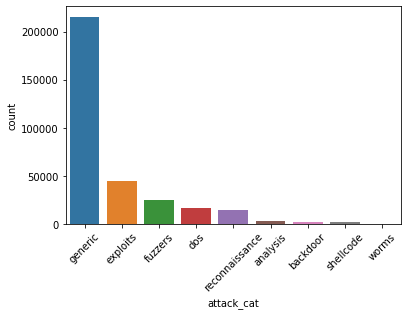

In [ ]:
# Most common type of attacks 
df = all_data[all_data['attack_cat'] != "normal"]
sns.countplot(x='attack_cat', data=df, order = df['attack_cat'].value_counts().index)
plt.xticks(rotation=45)
plt.show()

- The most common type of attack is generic, exploits and fuzzers. A generic attack is one that works against all block-ciphers (with a given block and key size), without consideration about the structure of the block-cipher. 

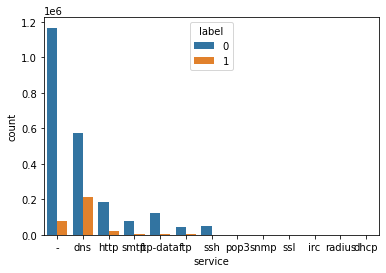

In [ ]:
# Which type of service had the highest attacks?
sns.countplot(x='service', hue='label', data=all_data)
plt.show()

DNS had the highest number of attacks, followed by http compared to the other types of service.

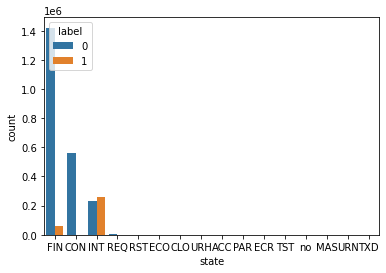

In [ ]:
# Which type of state and its dependent protocol had the highest attacks?
sns.countplot(x='state', hue='label', data=all_data, order = all_data['state'].value_counts().index)
plt.show()

INT, a TCP protocol state,  had the highest number of attacks compared to other protocols.

In [ ]:
# Which type of transaction protocol had the highest attacks?
all_data.proto.value_counts()


tcp     1495071
udp      990434
unas      16202
arp       10064
ospf       7798
         ...   
smp         137
igmp         64
udt           8
rtp           7
esp           2
Name: proto, Length: 135, dtype: int64

TCP has the highest number of attacks. A TCP connection   is particularly vulnerable to a DoS attack referred to as the TCP SYN Flood attack. The process is also susceptible to access and modification attacks

In [ ]:
# # The IPs with the most number of attacks
# # Viewing the total number of attacks (1) versus normal traffic (0)
udp = all_data['proto'].value_counts()
udp
# Finding exactly which kind of attack was highest
all_data.groupby('label').size().reset_index(name = 'frequency').rename(columns = {'0':''})


,label,frequency
0,0,2218760
1,1,321283


- Network attacks constitute 321,283 records from the whole dataset records. The remaining records were normal traffic.

In [ ]:
## Grouping attack_cat by label to identify the most frequent attacks
all_data.groupby('attack_cat').size().sort_values(ascending=False).reset_index(name = 'frequency').rename(columns = {'0':''})

,attack_cat,frequency
0,normal,2218760
1,generic,215481
2,exploits,44525
3,fuzzers,24246
4,dos,16353
5,reconnaissance,13987
6,analysis,2677
7,backdoor,2329
8,shellcode,1511
9,worms,174


Therefore, generic, exploits, fuzzers, dos, 
reconnaissance, analysis, backdoors, shellcodes and worms were the 10 most frequent attacks in that order


In [ ]:
# Differences between the distribution  of normal and anomaly traffic
normal = all_data[all_data['label']==0]
anomaly = all_data[all_data['label']==1]

In [ ]:
# Function for distribution plot of numerical variables
def dual_plot(col, data1=normal, data2=anomaly, label1='normal', label2='anomaly', method=None):
    if method != None:
        sns.distplot(data1[col].apply(method), label=label1, hist=False, rug=True)
        sns.distplot(data2[col].apply(method), label=label2, hist=False, rug=True)
    else:
        sns.distplot(data1[col], label=label1, hist=False, rug=True)
        sns.distplot(data2[col], label=label2, hist=False, rug=True)
    plt.legend()
    
def catplot(data, col):
    ax = sns.catplot(x=col, hue="label", col="type",data=data, kind="count", height=5, legend=False, aspect=1.4)
    ax.set_titles("{col_name}")
    ax.add_legend(loc='upper right',labels=['normal','attack'])
    plt.show(ax)

Distribution of smean & dmean mean variables

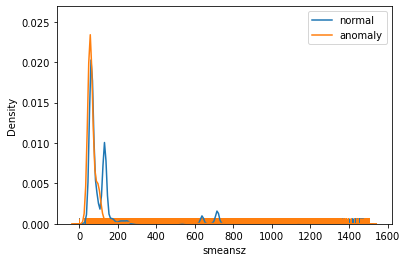

In [ ]:
dual_plot('smeansz')

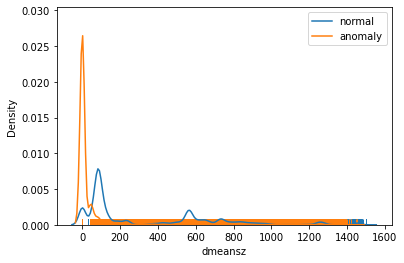

In [ ]:
dual_plot('dmeansz')

- dmean and smean is the mean of the packet size.
- Most anomalies in the dmean variable had means of 0 to 100

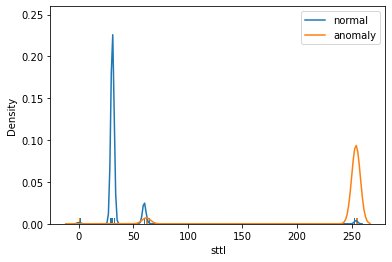

In [ ]:
dual_plot('sttl')

sttl: Source to destination time to live value
For sttl most of the anomalies have live values around 65 and 250

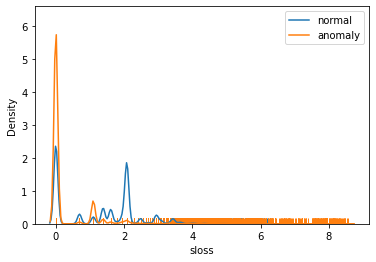

In [ ]:
# sloss with a log transformation
dual_plot('sloss', method=np.log1p)

- sloss is defined as the source packet retransmitted or dropped
- Anomaly ranged btn log 0 to 2.5

In [ ]:
# Getting categorical features to perform bivariate summaries
cat_cols = all_data[['srcip','sport','dstip','dsport','proto','state','service','ct_ftp_cmd','attack_cat']]

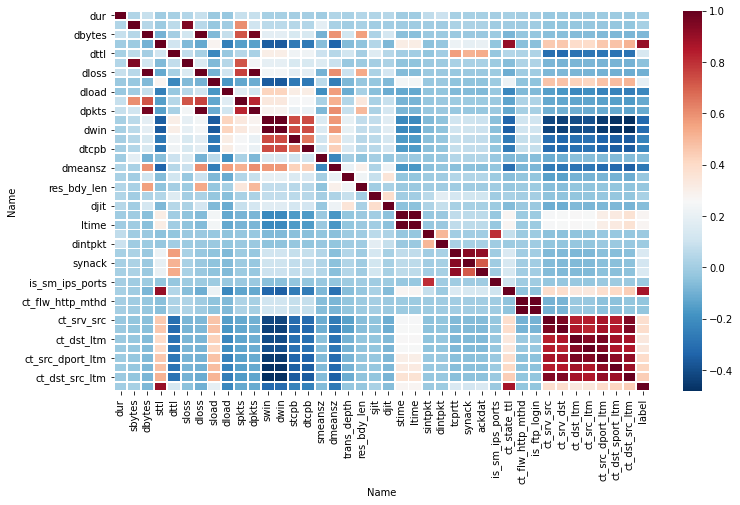

In [ ]:
#calculating the correlation between numnerical variables in the dataset using Perason's method
num_cols = all_data.select_dtypes([np.number]).columns
correlations1 = all_data[num_cols].corr(method='pearson')

#Chosing the size of the heatmap
plt.figure(figsize = (12,7)) 

#Displaying correlations using the seaborn heatmap 
sns.heatmap(correlations1, 
            cmap='RdBu_r',
            annot=False,
            linewidth=0.8)

Judging from the different degrees/shades of the blue and maroon colours, we can tell there are a few features correlated(+/-) with the target variable and others are correlated(+/-) with each other. 

## Dimensionality Reduction using PCA





In [ ]:
# first we standardise our data before applying PCA

from sklearn.preprocessing import StandardScaler

# Creating numerical columns variable
num_cols = all_data.select_dtypes([np.number]).columns

# Scaling our data
x = all_data[num_cols].drop(columns = ['label'])
y = all_data['label']
x = StandardScaler().fit_transform(x)
x = pd.DataFrame(x)

from sklearn.decomposition import PCA

# Applying PCA on our data 
pca = PCA()
x_pca = pca.fit_transform(x)
x_pca = pd.DataFrame(x_pca)
x_pca.head()

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38
0,0.151239,-1.678510,-1.149462,1.698794,0.279603,0.180835,-0.607426,1.652675,0.385259,0.054191,-0.113703,-0.133530,-0.015628,-0.095305,-0.158604,0.085228,0.000438,0.099455,-0.036494,0.000595,-0.147636,0.073279,0.295214,-0.114831,-0.063643,0.038523,-0.009651,-0.029540,-0.018032,-0.173967,0.094841,-0.066923,-0.007490,0.002973,-0.002522,0.005107,-3.457258e-07,3.445496e-16,-2.106956e-16
1,-0.136687,-1.484692,-1.169432,1.537045,0.123687,0.205253,-0.511299,1.753657,0.207598,-0.256273,-0.212865,-0.279953,0.080558,-0.066758,-0.127463,0.081356,-0.176460,0.053958,-0.038304,0.000146,0.459338,0.118821,0.441931,-0.070219,0.004703,-0.138357,0.155912,-0.034233,-0.008193,0.226235,-0.315326,-0.243155,0.012550,0.006137,-0.004463,-0.002098,-1.804598e-07,-7.856850e-15,4.151565e-15
2,0.047341,-1.599349,-1.182274,1.650679,0.140159,0.180600,-0.585009,1.698967,0.224182,-0.270250,-0.188980,-0.283250,0.084412,-0.062685,-0.105131,0.062961,-0.210092,0.023257,-0.032246,0.000418,0.320945,0.105312,0.393298,-0.050581,-0.109920,0.111288,-0.034628,-0.006121,-0.018601,0.092848,0.028969,-0.291781,0.006465,0.006151,-0.003804,-0.002083,-2.282680e-07,-2.648670e-14,1.399731e-14
3,0.029141,-1.580670,-1.180221,1.629456,0.141462,0.192832,-0.571816,1.703815,0.221096,-0.255546,-0.189139,-0.271852,0.074166,-0.068021,-0.096296,0.069386,-0.177340,0.037355,-0.031654,0.000383,0.362761,0.111927,0.416022,-0.068782,-0.098139,0.082126,-0.010913,-0.015433,-0.017068,0.125426,-0.020307,-0.278528,0.009884,0.006214,-0.003559,-0.002201,-2.151151e-07,-4.859892e-14,2.578948e-14
4,0.153825,-1.680673,-1.145063,1.699020,0.293009,0.185411,-0.596383,1.648634,0.403506,0.089101,-0.109288,-0.107182,-0.032712,-0.098383,-0.155781,0.084946,0.035641,0.109314,-0.038080,0.000563,-0.146013,0.075900,0.304394,-0.129361,-0.063402,0.037649,-0.010007,-0.035118,-0.018789,-0.172296,0.094626,-0.068411,-0.005974,0.003245,-0.002111,0.004721,-3.724990e-07,-2.091299e-13,1.116473e-13


In [ ]:
# Getting an array of the explained variance ratio
explained_variance = pca.explained_variance_ratio_
explained_variance

array([2.39525362e-01, 1.14008769e-01, 8.80884629e-02, 6.14894345e-02,
       5.73256214e-02, 5.17346949e-02, 4.91027354e-02, 4.34424781e-02,
       4.04014273e-02, 3.08403877e-02, 3.05769176e-02, 2.66846024e-02,
       2.41601116e-02, 2.20499773e-02, 1.85672710e-02, 1.68072691e-02,
       1.33792946e-02, 1.25760543e-02, 1.07967071e-02, 9.00740088e-03,
       7.67811297e-03, 7.38441995e-03, 7.15322720e-03, 4.64113799e-03,
       3.49516900e-03, 1.88496565e-03, 1.81142059e-03, 1.49653465e-03,
       1.20500410e-03, 8.70384153e-04, 8.23715876e-04, 6.57760348e-04,
       2.24470040e-04, 5.43189599e-05, 4.46129721e-05, 9.76672874e-06,
       3.68946327e-12, 3.90166904e-33, 2.55209513e-33])

The explained variances and values for the principal components above indicate that most of the features are important. Additionally, the first few principal components explain very little information about our data as seen in the results of Dimensionality Reduction using PCA above hence we are going to try dimensionality reduction using Feature Selection

Dimensionality Reduction using Feature Selection (Filter Method)

In [ ]:
# From Correlation Matrix in Bivariate Summaries, we can visually see some correlations between target variable and independent features from the 
# different shades of blue and maroon

# Identifying independent features with correlations with target variable "label"

cor_target = abs(correlations1["label"])
cor_target

Name
dur                 0.001959
sbytes              0.010180
dbytes              0.075543
sttl                0.904393
dttl                0.134947
sloss               0.043272
dloss               0.095855
sload               0.192278
dload               0.219710
spkts               0.120880
dpkts               0.115947
swin                0.315109
dwin                0.313920
stcpb               0.233422
dtcpb               0.233513
smeansz             0.065363
dmeansz             0.272397
trans_depth         0.029041
res_bdy_len         0.027339
sjit                0.020959
djit                0.054420
stime               0.275660
ltime               0.275660
sintpkt             0.019034
dintpkt             0.010632
tcprtt              0.143109
synack              0.122253
ackdat              0.143443
is_sm_ips_ports     0.015477
ct_state_ttl        0.873694
ct_flw_http_mthd    0.031822
is_ftp_login        0.031822
ct_srv_src          0.383007
ct_srv_dst          0.386509
ct_dst_lt

We can see all features are correlated with target variable in different degrees. We will only keep features with an absolute correlation coefficient of above 0.3 since most of our features are not strongly correlateed with target variable i.e.

*   0.9 to 1.0 -very strong correlation.
*   0.7 to 0.9 -strong correlation.
*   0.5 to 0.7 -moderate correlation.
*   0.3 to 0.5 -weak correlation.
*   0.0 to 0.3 -negligible correlation.

In [ ]:
#Selecting correlated features with cutt off coefficient of 0.3
relevant_features = cor_target[cor_target>0.3]
relevant_features

Name
sttl                0.904393
swin                0.315109
dwin                0.313920
ct_state_ttl        0.873694
ct_srv_src          0.383007
ct_srv_dst          0.386509
ct_dst_ltm          0.339464
ct_src_ltm          0.343246
ct_src_dport_ltm    0.396749
ct_dst_sport_ltm    0.419056
ct_dst_src_ltm      0.439916
label               1.000000
Name: label, dtype: float64

## Sampling

 We performed stratified sampling since our data had over 2.5 Million records and this would have caused our notebook to crash while performing our analysis. We chose this sampling method with a fraction of 10% of the data so we can retain the exact proportions of attacks from the main dataset in the sampled data.

### Stratified Sampling

In [ ]:
# Checking Value Counts for attack_cat before stratified sampling
all_data['attack_cat'].value_counts()

normal            2218760
generic            215481
exploits            44525
fuzzers             24246
dos                 16353
reconnaissance      13987
analysis             2677
backdoor             2329
shellcode            1511
worms                 174
Name: attack_cat, dtype: int64

In [ ]:
# Creating a stratified sample of our data grouped by attack_cat so as to retain the same proportion of attack_cat
# above in our sample

# High sampling fraction produce a wider margin of sampling error. For this reason we select a 10% fraction of the population
# to reduce sampling error.

strat_sample = all_data.groupby("attack_cat", group_keys=False).apply(lambda grouped_subset : grouped_subset.sample(frac=0.1))

# Exporting stratified sample to csv
#strat_sample.to_csv("/content/strat_sample.csv", index = False)

strat_sample['attack_cat'].value_counts()

normal            221876
generic            21548
exploits            4452
fuzzers             2425
dos                 1635
reconnaissance      1399
analysis             268
backdoor             233
shellcode            151
worms                 17
Name: attack_cat, dtype: int64

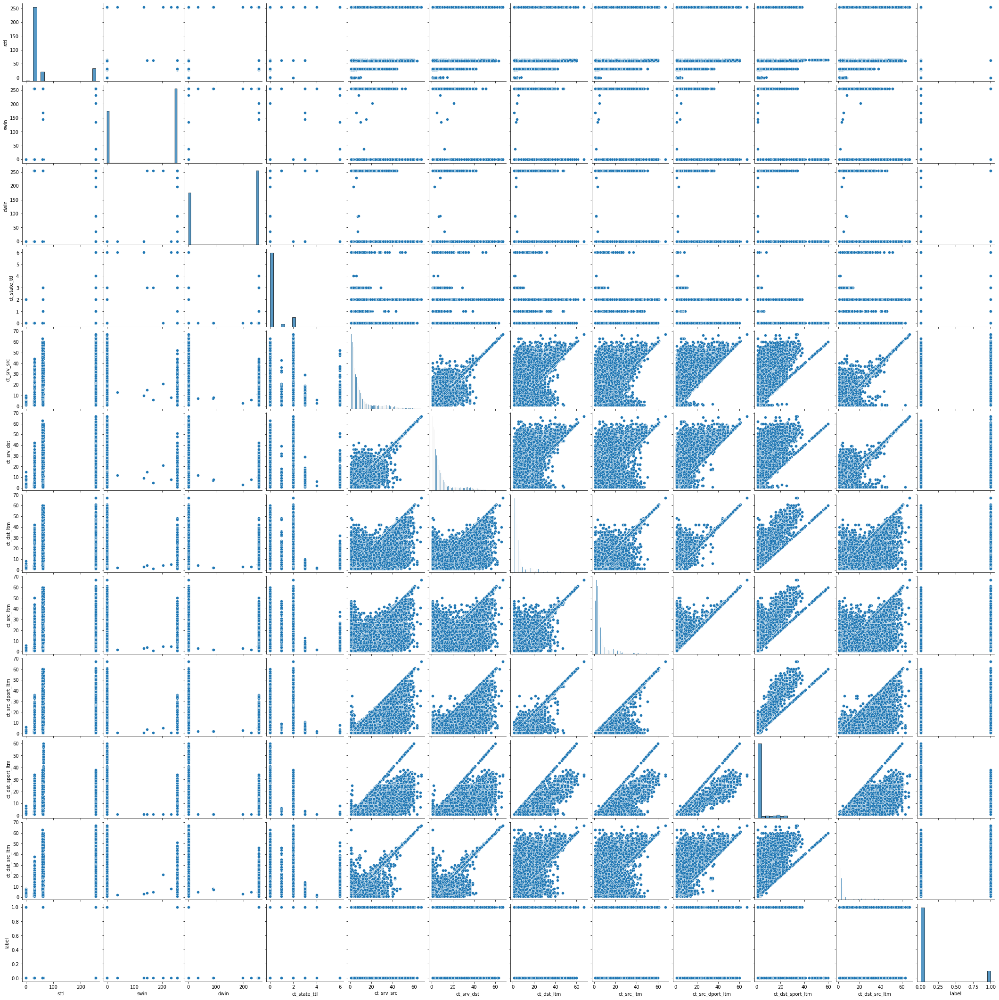

In [ ]:
# Scatter plot matrix of relevant features
features = strat_sample[['sttl','swin','dwin','ct_state_ttl','ct_srv_src','ct_srv_dst','ct_dst_ltm',
                         'ct_src_ltm','ct_src_dport_ltm','ct_dst_sport_ltm','ct_dst_src_ltm','label' ]]
sns.pairplot(features)

From our plots,, the points are scattered all over the points signifying that our variables have very little or no correlation with our label

#### Checking for multicollinearity

Multicollinearity makes it tedious to assess the relative importance of the independent variables in explaining the variation caused by the dependent variable thereby the need for checking for collinear features and dropping them

In [ ]:
# Using VIF to check for multicollinearity for the independent variables

from statsmodels.stats.outliers_influence import variance_inflation_factor

# Creating a function that calculates VIF
def calc_vif(a):
    vif = pd.DataFrame()
    vif["variables"] = a.columns
    vif["VIF"] = [variance_inflation_factor(a.values, i) for i in range(a.shape[1])]
    return(vif)
    
# Calling the function
calc_vif(features)

,variables,VIF
0,sttl,11.710008
1,swin,662.108814
2,dwin,665.976397
3,ct_state_ttl,9.915283
4,ct_srv_src,26.775443
5,ct_srv_dst,30.312235
6,ct_dst_ltm,25.997745
7,ct_src_ltm,19.538575
8,ct_src_dport_ltm,29.884185
9,ct_dst_sport_ltm,9.959860


From above we can see that some features have very high VIF. We'll remove these features one by one until the VIF is approximately 11, indicating no multicollinearity.

In [ ]:
# Removing the multicollinear features
new_features = features.drop(columns = ['dwin','ct_srv_dst','ct_src_dport_ltm','ct_dst_src_ltm','ct_dst_ltm'])
calc_vif(new_features)

,variables,VIF
0,sttl,11.207608
1,swin,1.732083
2,ct_state_ttl,6.812116
3,ct_srv_src,7.261744
4,ct_src_ltm,7.907548
5,ct_dst_sport_ltm,6.913371
6,label,6.687320


## 7. Implementing the Solution

## **Logistic Regression**

Baseline Model Selected to implement the solution is Logistic Regression

In [ ]:
# Selecting relevant categorical features and the numerical features from feature selection
final = strat_sample[["sttl", "swin",	"ct_state_ttl",	"ct_srv_src",	"ct_src_ltm",	"ct_dst_sport_ltm",
"proto", "service","state",	"label"]]

The features used in modelling were obtained from feature selection and added onto the 3 relevant categorical variables

In [ ]:
# Selecting relevant categorical features and the numerical features from feature selection
final = strat_sample[["sttl", "swin",	"ct_state_ttl",	"ct_srv_src",	"ct_src_ltm",	"ct_dst_sport_ltm",
"proto", "service","state",	"label"]]
# # Encoding categorical feaqtures using pd.get_dummies
final_encoded = final.merge(pd.get_dummies(final[["proto","service","state"]], drop_first=True, prefix=["proto","service","state"]), left_index=True, right_index=True)
final_encoded2 = final_encoded.drop(columns = ["proto","service","state"])
final_encoded2.head(5)

,sttl,swin,ct_state_ttl,ct_srv_src,ct_src_ltm,ct_dst_sport_ltm,label,proto_a/n,proto_aes-sp3-d,proto_any,proto_argus,proto_aris,proto_arp,proto_ax.25,proto_bbn-rcc,proto_bna,proto_br-sat-mon,proto_cbt,proto_cftp,proto_chaos,proto_compaq-peer,proto_cphb,proto_cpnx,proto_crtp,proto_crudp,proto_dcn,proto_ddp,proto_ddx,proto_dgp,proto_egp,proto_eigrp,proto_emcon,proto_encap,proto_esp,proto_etherip,proto_fc,proto_fire,proto_ggp,proto_gmtp,proto_gre,...,proto_ttp,proto_udp,proto_udt,proto_unas,proto_uti,proto_vines,proto_visa,proto_vmtp,proto_vrrp,proto_wb-expak,proto_wb-mon,proto_wsn,proto_xnet,proto_xns-idp,proto_xtp,proto_zero,service_dhcp,service_dns,service_ftp,service_ftp-data,service_http,service_irc,service_pop3,service_radius,service_smtp,service_snmp,service_ssh,service_ssl,state_CLO,state_CON,state_ECO,state_FIN,state_INT,state_MAS,state_PAR,state_REQ,state_RST,state_TXD,state_URH,state_no
82199,254,0,2,22,6,4,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0
2150882,254,0,2,8,7,6,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0
1734974,62,255,1,7,4,4,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0
1627257,254,0,2,4,2,2,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0
1875018,254,0,2,7,5,3,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0


In [ ]:
# Splitting our dataset into features (X) and target (y)
X = final_encoded2.drop(columns = ['label']).values
y = final_encoded2['label'].values
print(X.shape)
print(y.shape)

(254004, 163)
(254004,)


In [ ]:
# splitting our dataset into 80-20 train-test sets
from sklearn.model_selection import train_test_split 
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state = 42, stratify = y)

# creating a balanced dataset
from imblearn.over_sampling import SMOTE
smt = SMOTE()
X_train, y_train = smt.fit_sample(X_train, y_train)
# we check the amount of records in each category
np.bincount(y_train)

array([177501, 177501])

In [ ]:
# model creation
from sklearn.linear_model import LogisticRegression
logistic_classifier = LogisticRegression()

# training our model
logistic_classifier.fit(X_train, y_train)

# making predictions
y_pred_logistic = logistic_classifier.predict(X_test)

# model evaluation
from sklearn import metrics

print(metrics.f1_score(y_pred_logistic, y_test))
print(metrics.confusion_matrix(y_test, y_pred_logistic))
print(metrics.classification_report(y_test, y_pred_logistic))

0.9313437224345781
[[43532   843]
 [   91  6335]]
              precision    recall  f1-score   support

           0       1.00      0.98      0.99     44375
           1       0.88      0.99      0.93      6426

    accuracy                           0.98     50801
   macro avg       0.94      0.98      0.96     50801
weighted avg       0.98      0.98      0.98     50801



Our baseline model has perfomed well with an f1-score 93.96

0.9834207984289177

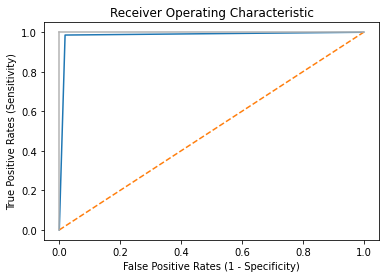

In [ ]:
# Exploring another metric below 

# plotting roc curve (receiving operating characteristic curve)
from sklearn.metrics import roc_curve, roc_auc_score

# Create true and false positive rates
false_positive_rate, true_positive_rate, threshold = roc_curve(y_test, y_pred_logistic)

# Plot ROC curve
plt.title('Receiver Operating Characteristic')
plt.plot(false_positive_rate, true_positive_rate)
plt.plot([0, 1], ls="--")
plt.plot([0, 0], [1, 0] , c=".7"), plt.plot([1, 1] , c=".7")
plt.ylabel('True Positive Rates (Sensitivity)')
plt.xlabel('False Positive Rates (1 - Specificity)')

# roc_auc_score
roc_auc_score(y_test, y_pred_logistic)

The ROC curves is not smooth as expected because most of our features were binary so we wil try and plot the probabilities to see if the sharp corners will turn into a curve

0.9957062111229469

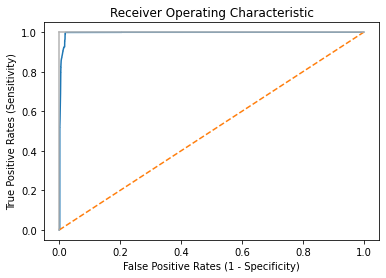

In [ ]:
# making probability predictions
y_pred_prob_logistic = logistic_classifier.predict_proba(X_test)
##keeping probabilities for attack
attack_prob = y_pred_prob_logistic[:, 1]
# Create true and false positive rates for attack and normal probabilities
false_positive_rate, true_positive_rate, threshold = roc_curve(y_test, attack_prob)

# Plot ROC curve
plt.title('Receiver Operating Characteristic')
plt.plot(false_positive_rate, true_positive_rate)
plt.plot([0, 1], ls="--")
plt.plot([0, 0], [1, 0] , c=".7"), plt.plot([1, 1] , c=".7")
plt.ylabel('True Positive Rates (Sensitivity)')
plt.xlabel('False Positive Rates (1 - Specificity)')

# roc_auc_score
roc_auc_score(y_test, attack_prob)




Even after plotting the probabilities of attacks, our ROC curves still has sharp edges....This a challenge

## 8. Challenging the solution

## Random Forest

In [ ]:
# Splitting the data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state = 42, stratify = y)

# creating a balanced dataset
from imblearn.over_sampling import SMOTE
smt = SMOTE()
X_train, y_train = smt.fit_sample(X_train, y_train)
# we check the amount of records in each category
np.bincount(y_train)

array([177501, 177501])

In [ ]:
from sklearn.ensemble import RandomForestClassifier
from sklearn import metrics
# Initialising the random forest classifier
classifier = RandomForestClassifier()

# Fitting the model on the training set
classifier.fit(X_train, y_train)

# Running the prediction
y_pred = classifier.predict(X_test)

# Comparing the true and predicted values
comparison_df = pd.DataFrame({'Actual': y_test.flatten(), 'Predicted': y_pred.flatten()})
comparison_df.head()

In [ ]:
# Checking the accuracy
# model evaluation
from sklearn import metrics

print(metrics.f1_score(y_pred_logistic, y_test))
print(metrics.confusion_matrix(y_test, y_pred_logistic))
print(metrics.classification_report(y_test, y_pred_logistic))

Accuracy score: 0.9894293419420878
Confusion matrix 
 [[44029   346]
 [  191  6235]]
F1 Score: 0.958714538325517


Random Forest model had an f1-score of 0.9587 which is an improvement on our baseline model which had an f1-score of 0.93

In [ ]:
from sklearn.tree import export_graphviz
from sklearn.externals.six import StringIO  
import pydotplus
from IPython.display import Image  

# Visualising the 50th tree
dot_data = StringIO()
tree = classifier.estimators_[5]

export_graphviz(tree, out_file=dot_data,  
                filled=True, rounded=True,
                special_characters=True,feature_names = X.columns)
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
graph.write_png('hypothyroid_forest.png')
Image(graph.create_png())

[('sttl', 0.24), ('swin', 0.0), ('ct_state_ttl', 0.33), ('ct_srv_src', 0.03), ('ct_src_ltm', 0.02), ('ct_dst_sport_ltm', 0.27), ('proto_a/n', 0.0), ('proto_aes-sp3-d', 0.0), ('proto_any', 0.0), ('proto_argus', 0.0)]

Variable: ct_state_ttl                   Importance: 0.33
Variable: ct_dst_sport_ltm               Importance: 0.27
Variable: sttl                           Importance: 0.24
Variable: ct_srv_src                     Importance: 0.03
Variable: ct_src_ltm                     Importance: 0.02
Variable: swin                           Importance: 0.0
Variable: proto_a/n                      Importance: 0.0
Variable: proto_aes-sp3-d                Importance: 0.0
Variable: proto_any                      Importance: 0.0
Variable: proto_argus                    Importance: 0.0


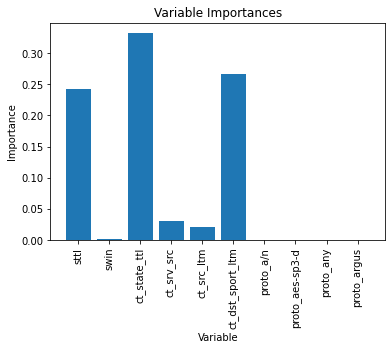

In [ ]:
# Get numerical feature importances
importances = list(tree.feature_importances_)

# We now use some Python magic to connect each feature with its importance
# List of tuples with variable and importance
feature_importances = [(feature, round(importance, 2)) for feature, importance in zip(X, importances)]

print(feature_importances[:10]) #this already has all the information we need, but it can be tricky to see when there are too many features.
print()

# Nice to have: We can sort the val
# Nice to have: We can sort the values in descending order, since we care about the most important features first.
feature_importances = sorted(feature_importances[:10], key = lambda x: x[1], reverse = True)

# Print out the feature and importances 
[print('Variable: {:30} Importance: {}'.format(*pair)) for pair in feature_importances[:10]];
# Import matplotlib for plotting and use magic command for Jupyter Notebooks
import matplotlib.pyplot as plt

# list of x locations for plotting
x_values = list(range(len(importances[:10])))
# Make a bar chart
plt.bar(x_values, importances[:10], orientation = 'vertical')
# Tick labels for x axis
plt.xticks(x_values, X, rotation='vertical')
# Axis labels and title
plt.ylabel('Importance'); plt.xlabel('Variable'); plt.title('Variable Importances');


**Observation**
- The 10 most important features in our model include:
1. Variable: ct_state_ttl                   Importance: 0.33
2. Variable: ct_dst_sport_ltm               Importance: 0.27
3. Variable: sttl                           Importance: 0.24
4. Variable: ct_srv_src                     Importance: 0.03
5. Variable: ct_src_ltm                     Importance: 0.02
6. Variable: swin                           Importance: 0.0
7. Variable: proto_a/n                      Importance: 0.0
8. Variable: proto_aes-sp3-d                Importance: 0.0
9. Variable: proto_any                      Importance: 0.0
10. Variable: proto_argus                    Importance: 0.0


## **Naive Bayes**


In [ ]:

from sklearn.naive_bayes import GaussianNB
naive_bayes = GaussianNB().fit(X_train, y_train)
y_pred_bayes = naive_bayes.predict(X_test)
# model evaluation
from sklearn import metrics

print(metrics.f1_score(y_pred_logistic, y_test))
print(metrics.confusion_matrix(y_test, y_pred_logistic))
print(metrics.classification_report(y_test, y_pred_logistic))

 Naive Bayes accuracy: 0.8896478415779216
 Naive Bayes accuracy: 
               precision    recall  f1-score   support

           0       0.89      1.00      0.94     44375
           1       1.00      0.13      0.23      6426

    accuracy                           0.89     50801
   macro avg       0.94      0.56      0.58     50801
weighted avg       0.90      0.89      0.85     50801

 Naive Bayes accuracy: 
 [[43653   722]
 [   44  6382]]


Naive's Baye's Classifier had an f1-score 0f 0.94..This is quite impressive!!

## **Gradient Boost**

In [ ]:
# importing our machine learning algorithms  

from sklearn.ensemble import GradientBoostingClassifier
# instantiating our algorithms

gbm_classifier = GradientBoostingClassifier()
# training our models
gbm_classifier.fit(X_train, y_train)
# making predictions
gbm_y_pred = gbm_classifier.predict(X_test)
# model evaluation
from sklearn import metrics

print(metrics.f1_score(y_pred_logistic, y_test))
print(metrics.confusion_matrix(y_test, y_pred_logistic))
print(metrics.classification_report(y_test, y_pred_logistic))

Gradient Boosting
0.9880711009625794
[[43990   221]
 [  385  6205]]
              precision    recall  f1-score   support

           0       0.99      1.00      0.99     44211
           1       0.97      0.94      0.95      6590

    accuracy                           0.99     50801
   macro avg       0.98      0.97      0.97     50801
weighted avg       0.99      0.99      0.99     50801

0.9682896963722285


Gradient Boost was our best perfoming model with an f1-score of 0.99....

## **Recommendations**

1. SSH was the least attacked as it is more secure because  cryptographic network protocol for operating network services securely over an unsecured network. 
2. Generic,exploits and fuzzers attacks were the most so the business should come up with methods to mitigate this attacks
3. DNS Was the most service that was attacked, the network admin should secure the vulnerabilities in the DNS
4. The network admin should secure the vulnerabilities in the DNS & flag IP Addresses 175.45.176.1 whose origin was from Potong-gang District in N. Korea

## 9. Follow up questions

### a). Did we have the right data?


*   We had the right data as our models performed well with good f1-scores

### c). Did we have the right question?



*   The question was correct as we were able to achieve all our objectives